In [31]:
import os
import sys
import nltk
import rich
import torch
import numpy as np
import pandas as pd
import random as rnd
import seaborn as sns
import matplotlib.pyplot as plt

from torch import nn
from dotenv   import load_dotenv
from nltk.tag import pos_tag
from nltk.corpus import wordnet
from nltk.tokenize import word_tokenize
from transformers  import AutoTokenizer, AutoConfig
from scipy.special import softmax
from sklearn.metrics  import confusion_matrix, roc_curve, auc, f1_score, accuracy_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import label_binarize, StandardScaler
from sklearn.model_selection import train_test_split

In [32]:
# Load DATA_PATH from .env file
load_dotenv()
data_path  = os.getenv("DATA_PATH")
model_path = os.getenv("MODEL_PATH")
cebab_path = os.getenv("CEBAB_PATH")

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = torch.load(model_path+'/retrained_RoBERTa_sentiment_balanced_acc_0.63.pth', map_location='cpu')
model_name = f"cardiffnlp/twitter-roberta-base-sentiment-latest"
tokenizer = AutoTokenizer.from_pretrained(model_name, use_fast=False)
rich.print(f"RoBERTa_sentiment on {device} w. balanced dataset.")

RoBERTa_sentiment on cpu w. balanced dataset.

In [33]:
# Load the datasets
df_goemo = pd.read_csv(data_path+"/goemo_predicted_balanced_acc_63_w_probability.csv")
df_goemo = df_goemo.loc[:,['text','admiration','amusement', 'anger', 'annoyance', 
                        'approval', 'caring', 'confusion', 'curiosity', 'desire', 
                        'disappointment', 'disapproval', 'disgust', 'embarrassment', 
                        'excitement', 'fear', 'gratitude', 'grief', 'joy', 'love', 
                        'nervousness', 'optimism', 'pride', 'realization', 'relief',
                        'remorse', 'sadness', 'surprise', 'neutral', 'predicted_sentiment']]
emotions = ['admiration','amusement', 'anger', 'annoyance', 
            'approval', 'caring', 'confusion', 'curiosity', 'desire', 
            'disappointment', 'disapproval', 'disgust', 'embarrassment', 
            'excitement', 'fear', 'gratitude', 'grief', 'joy', 'love', 
            'nervousness', 'optimism', 'pride', 'realization', 'relief',
            'remorse', 'sadness', 'surprise', 'neutral']

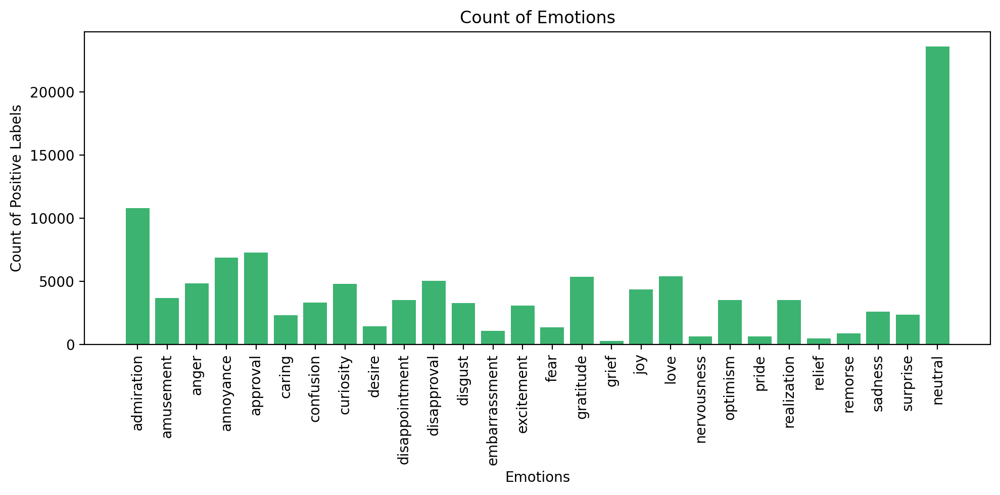

In [5]:
# Count 'Positive' in each column
positive_counts = {col: (df_goemo[col] == 'Positive').sum() for col in emotions}

# Create the bar plot
plt.figure(figsize=(10, 5),dpi=200)
plt.bar(positive_counts.keys(), positive_counts.values(), color='mediumseagreen')
plt.xlabel('Emotions')
plt.ylabel('Count of Positive Labels')
plt.title('Count of Emotions')
plt.xticks(rotation=90)  # Rotate labels for better visibility if needed
plt.tight_layout()
plt.show()

## Emotion distribution of the 1000 dataset

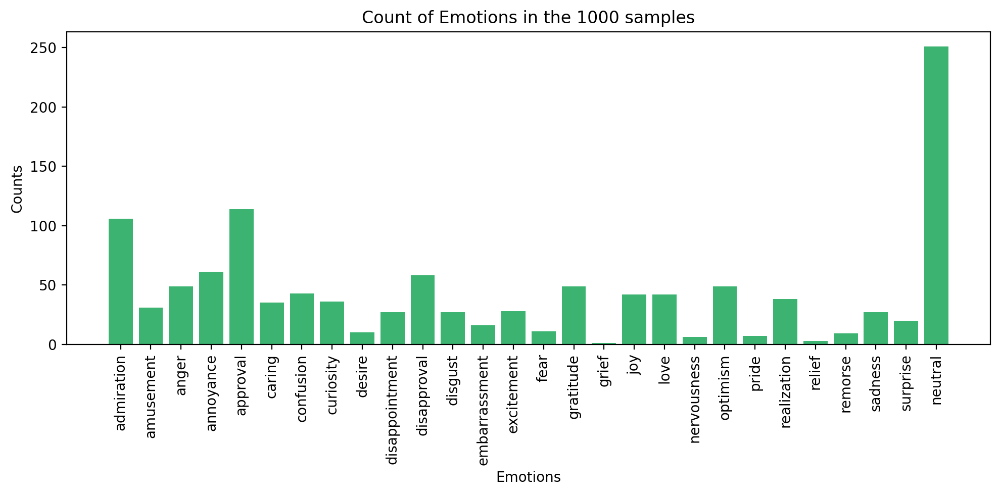

In [11]:
df_goemo_1000 = pd.read_csv(data_path+"/goemo_samples_1000.csv")

# Count 'Positive' in each column
positive_counts = {col: (df_goemo_1000[col] == 'Positive').sum() for col in emotions}

# Create the bar plot
plt.figure(figsize=(10, 5),dpi=200)
plt.bar(positive_counts.keys(), positive_counts.values(), color='mediumseagreen')
plt.xlabel('Emotions')
plt.ylabel('Counts')
plt.title('Count of Emotions in the 1000 samples')
plt.xticks(rotation=90)  # Rotate labels for better visibility if needed
plt.tight_layout()
plt.show()

In [12]:
mapping_dict = {'Positive': 1, 'unknown': 0}
for col in emotions:
    df_goemo_1000[col] = df_goemo_1000[col].map(mapping_dict)
    
df_goemo_1000['emotions_count'] = df_goemo_1000.iloc[:, 1:-1].sum(axis=1)

two_or_more = (df_goemo_1000['emotions_count'] >= 2).sum()
print(f"Entries with two or more emotions: {two_or_more}")

Entries with two or more emotions: 188


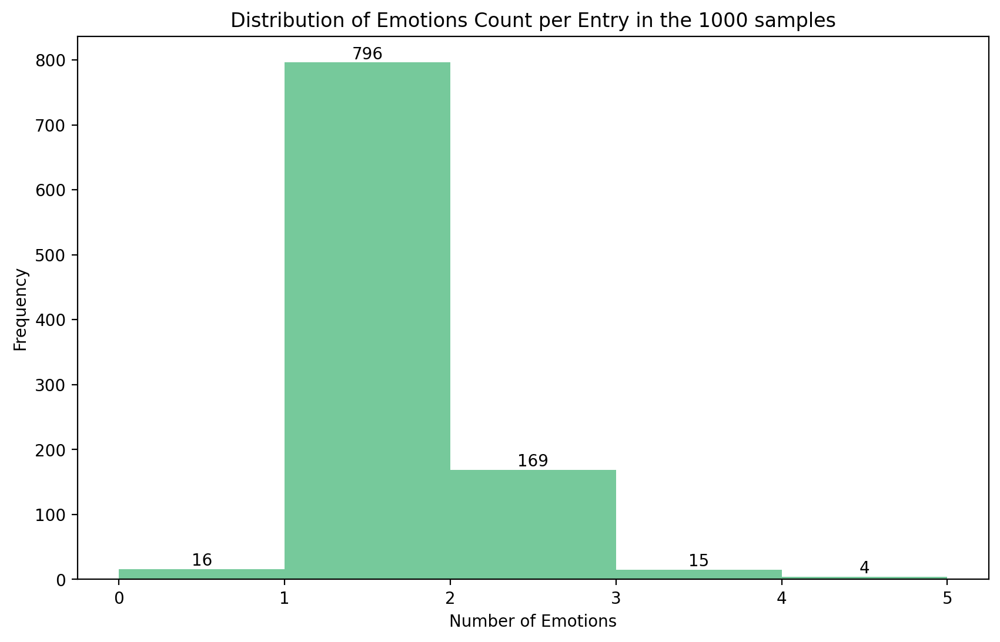

In [14]:
# Plotting the distribution of the number of positive emotions per entry
plt.figure(figsize=(10, 6), dpi=200)

counts, bins, patches = plt.hist(df_goemo_1000['emotions_count'], 
                                 bins=range(int(df_goemo_1000['emotions_count'].max()+1)), 
                                 color='mediumseagreen', alpha=0.7)

# Add counts above the two bar graphs
for count, bin, patch in zip(counts, bins, patches):
    height = patch.get_height()
    if height!= 0:
        plt.text(bin + 0.5, height + 0.15, int(count), ha='center', va='bottom')

plt.title('Distribution of Emotions Count per Entry in the 1000 samples')
plt.xlabel('Number of Emotions')
plt.ylabel('Frequency')
plt.xticks(range(int(df_goemo_1000['emotions_count'].max()+1)))
# plt.yscale('log')
plt.grid(False)
plt.show()

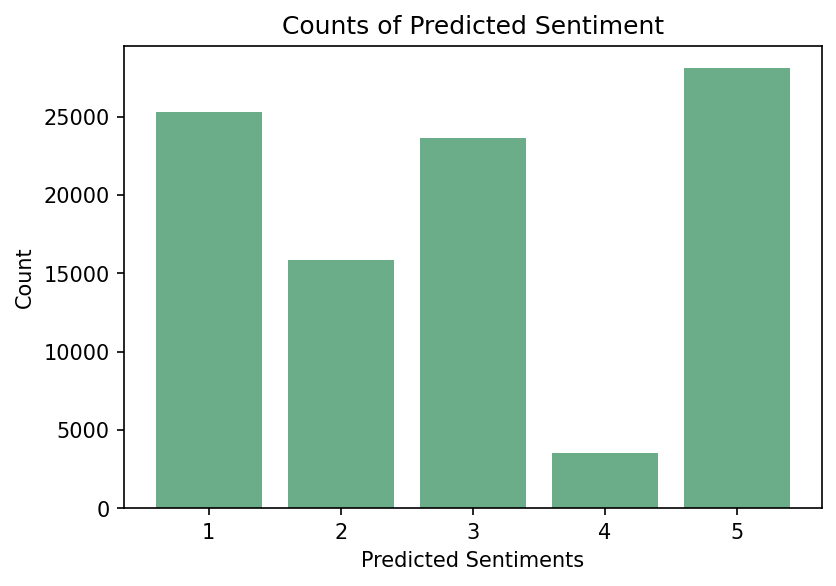

In [15]:
sentiment_counts = df_goemo['predicted_sentiment'].value_counts()

# Create the bar plot for predicted sentiment counts
plt.figure(figsize=(6, 4), dpi=150)
plt.bar(sentiment_counts.index, sentiment_counts.values, color='seagreen', alpha=0.7)
plt.xlabel('Predicted Sentiments')
plt.ylabel('Count')
plt.title('Counts of Predicted Sentiment')
plt.show()

In [16]:
mapping_dict = {'Positive': 1, 'unknown': 0}
for col in emotions:
    df_goemo[col] = df_goemo[col].map(mapping_dict)

In [17]:
# One-hot encode the predicted sentiment scores
sentiment_dummies = df_goemo[df_goemo['predicted_sentiment'].between(1, 5)]
sentiment_dummies = pd.get_dummies(sentiment_dummies['predicted_sentiment'], prefix='sentiment')

# Concatenate the one-hot encoded sentiments with the emotion columns
df_heatmap = pd.concat([df_goemo[emotions], sentiment_dummies], axis=1)
# Compute the correlation matrix
correlation_matrix = df_heatmap.corr().loc[sentiment_dummies.columns, emotions]

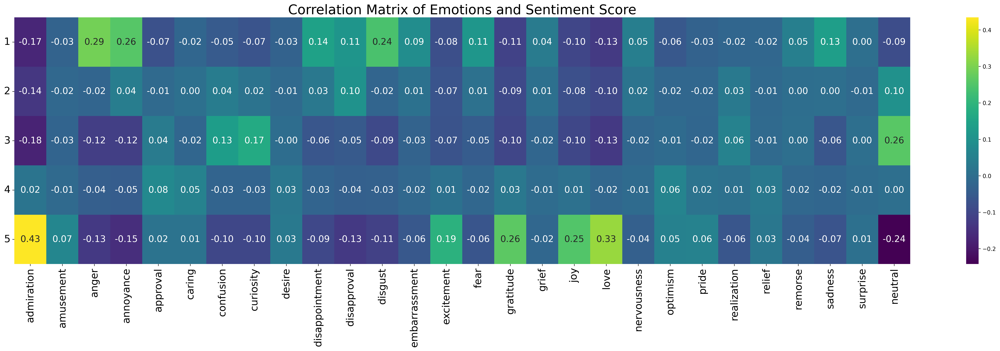

In [18]:
# Plot the heatmap
plt.figure(figsize=(36, 8),dpi=300)
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='viridis', cbar=True,
            annot_kws={"size": 16})
plt.xticks(rotation=90, fontsize=18)
plt.yticks(ticks=np.arange(len(sentiment_dummies.columns)) + 0.5, 
           labels=[1,2,3,4,5], fontsize=18, rotation=0)
plt.title('Correlation Matrix of Emotions and Sentiment Score', fontsize=24)
plt.show()

## reorder confusion matrix

In [22]:
# Define the new order of emotions based on their nature
new_order = [
    'admiration', 'approval', 'gratitude', 'love', 'relief', 
    'amusement', 'caring', 'excitement', 'joy', 'optimism', 
    'pride', 'curiosity', 'surprise', 'confusion', 'realization', 
    'anger', 'annoyance', 'disappointment', 'disapproval', 'disgust', 
    'embarrassment', 'fear', 'grief', 'nervousness', 'remorse', 
    'sadness', 'neutral'
]

# Define lists of positive, ambiguous, and negative emotions
positive_emotions = ['admiration', 'approval', 'gratitude', 'love', 'relief', 'amusement', 'caring', 'excitement', 'joy', 'optimism', 'pride']
ambiguous_emotions = ['curiosity', 'surprise', 'confusion', 'realization']
negative_emotions = ['anger', 'annoyance', 'disappointment', 'disapproval', 'disgust', 'embarrassment', 'fear', 'grief', 'nervousness', 'remorse', 'sadness']
neutral_emotion = ['neutral']


In [23]:
# Filter the dataframe for the predicted sentiment scores between 1 and 5
sentiment_dummies = df_goemo[df_goemo['predicted_sentiment'].between(1, 5)]
sentiment_dummies = pd.get_dummies(sentiment_dummies['predicted_sentiment'], prefix='sentiment')

# Concatenate the one-hot encoded sentiments with the emotion columns
df_heatmap = pd.concat([df_goemo[emotions], sentiment_dummies], axis=1)

# Compute the correlation matrix
correlation_matrix = df_heatmap.corr().loc[sentiment_dummies.columns, emotions]

# Filter the new_order to only include labels present in the correlation matrix
new_order_filtered = [emotion for emotion in new_order if emotion in correlation_matrix.columns]

# Reorder the correlation matrix
correlation_matrix_reordered = correlation_matrix[new_order_filtered]

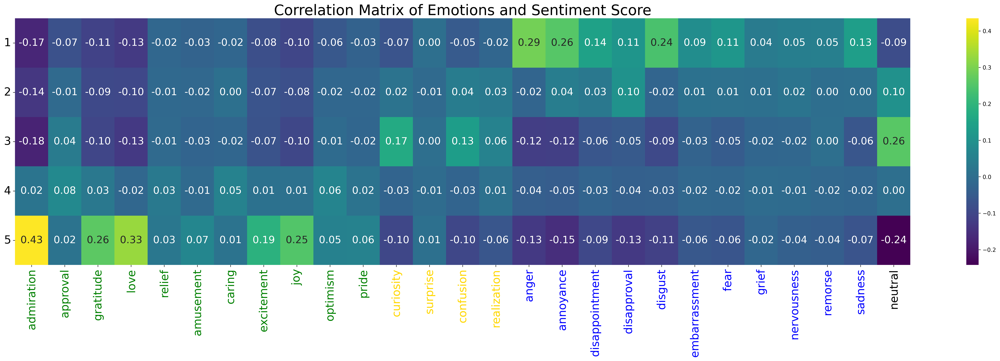

In [27]:
# Plot the heatmap
plt.figure(figsize=(36, 8), dpi=300)
sns.heatmap(correlation_matrix_reordered, annot=True, fmt=".2f", 
            cmap='viridis', cbar=True, annot_kws={"size": 18})

# Customize tick labels
xticks = plt.gca().get_xticklabels()
yticks = plt.gca().get_yticklabels()

for tick in xticks:
    if tick.get_text() in positive_emotions:
        tick.set_color('green')
    elif tick.get_text() in ambiguous_emotions:
        tick.set_color('gold')
    elif tick.get_text() in negative_emotions:
        tick.set_color('blue')
    elif tick.get_text() in neutral_emotion:
        tick.set_color('black')

plt.xticks(rotation=90, fontsize=20)
plt.yticks(ticks=np.arange(len(sentiment_dummies.columns)) + 0.5, 
           labels=[1, 2, 3, 4, 5], fontsize=20, rotation=0)
plt.title('Correlation Matrix of Emotions and Sentiment Score', fontsize=26)
plt.show()

In [9]:
# Calculate the sum of positive emotions for each entry
df_goemo['emotions_count'] = df_goemo.iloc[:, 1:-1].sum(axis=1)

# Count entries with two or more positive emotions
two_or_more = (df_goemo['emotions_count'] >= 2).sum()
print(f"Entries with two or more emotions: {two_or_more}")

Entries with two or more emotions: 18034


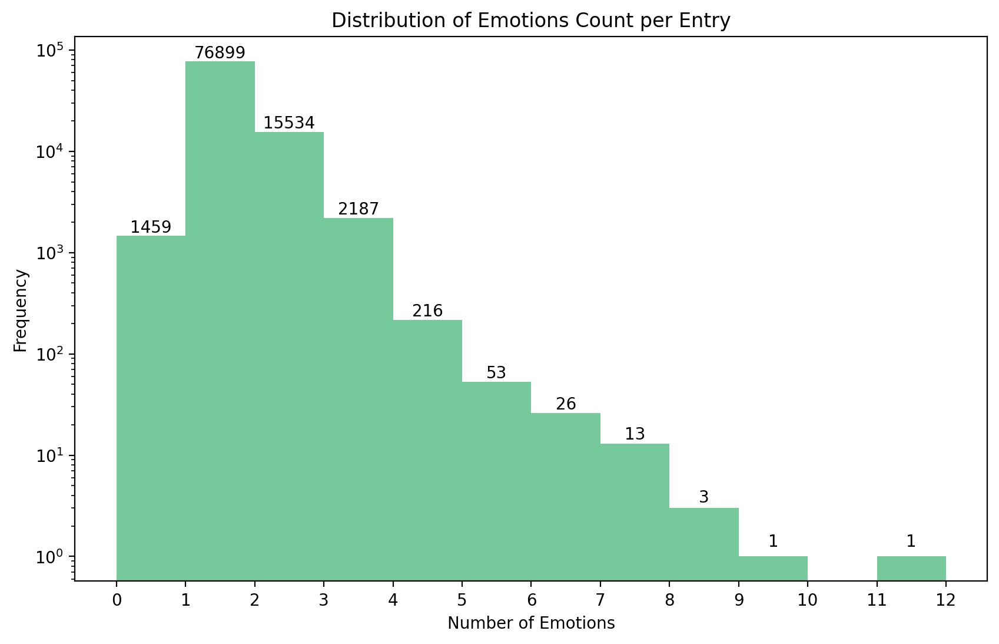

In [25]:
# Plotting the distribution of the number of positive emotions per entry
plt.figure(figsize=(10, 6), dpi=200)

counts, bins, patches = plt.hist(df_goemo['emotions_count'], 
                                 bins=range(int(df_goemo['emotions_count'].max()+1)), 
                                 color='mediumseagreen', alpha=0.7)

# Add counts above the two bar graphs
for count, bin, patch in zip(counts, bins, patches):
    height = patch.get_height()
    if height!= 0:
        plt.text(bin + 0.5, height + 0.15, int(count), ha='center', va='bottom')

plt.title('Distribution of Emotions Count per Entry')
plt.xlabel('Number of Emotions')
plt.ylabel('Frequency')
plt.xticks(range(int(df_goemo['emotions_count'].max()+1)))
plt.yscale('log')
plt.grid(False)
plt.show()

### PCA of dataset

In [28]:
# Separating out the features and standardizing them
x = df_goemo[emotions].values

# Performing PCA
pca = PCA(n_components=5)
principalComponents = pca.fit_transform(x)

vector = pca.components_
print(vector)

# Explained variance
explained_variance = pca.explained_variance_ratio_
print("Explained variance ratio:", explained_variance)

# Creating a new DataFrame for the PCA results
df_principal = pd.DataFrame(data = principalComponents,
                           columns = ['principal component 1', 
                                      'principal component 2', 
                                      'principal component 3',
                                      'principal component 4',
                                      'principal component 5'
                                      ])

# Concatenating the target variable
finalDf = pd.concat([df_principal, df_goemo[['predicted_sentiment']]], axis = 1)

[[ 2.26292960e-01  4.49420380e-02  6.01652916e-02  9.70857816e-02
   1.16657460e-01  2.63231419e-02  3.65856885e-02  5.88314611e-02
   1.65011921e-02  4.13899199e-02  6.24168205e-02  3.79998101e-02
   1.10953636e-02  4.00668409e-02  1.34784368e-02  7.91414252e-02
   2.74386873e-03  6.00149543e-02  7.59350539e-02  6.31430473e-03
   4.57804837e-02  8.05851418e-03  4.37806287e-02  5.01217620e-03
   8.65076605e-03  2.81313758e-02  2.63873500e-02 -9.40236904e-01]
 [ 9.02775856e-01 -2.08591879e-02 -1.50938032e-01 -3.01021062e-01
  -4.80335416e-03 -1.67337138e-02 -4.87691655e-02 -8.11914464e-02
  -3.63952291e-03 -7.38549600e-02 -1.41180482e-01 -7.59505729e-02
  -1.53304482e-02  6.89974380e-03 -1.73312203e-02  5.34682776e-02
  -3.04533711e-03  1.23309816e-02  9.22636517e-03 -6.28514073e-03
  -1.06519677e-02  8.27535327e-03 -3.78005228e-02 -1.98596550e-03
  -9.62643371e-03 -3.73749024e-02 -1.63112177e-02  1.53703281e-01]
 [-2.14911757e-01  2.05595036e-02 -1.73961345e-01 -4.94658645e-01
   8.041

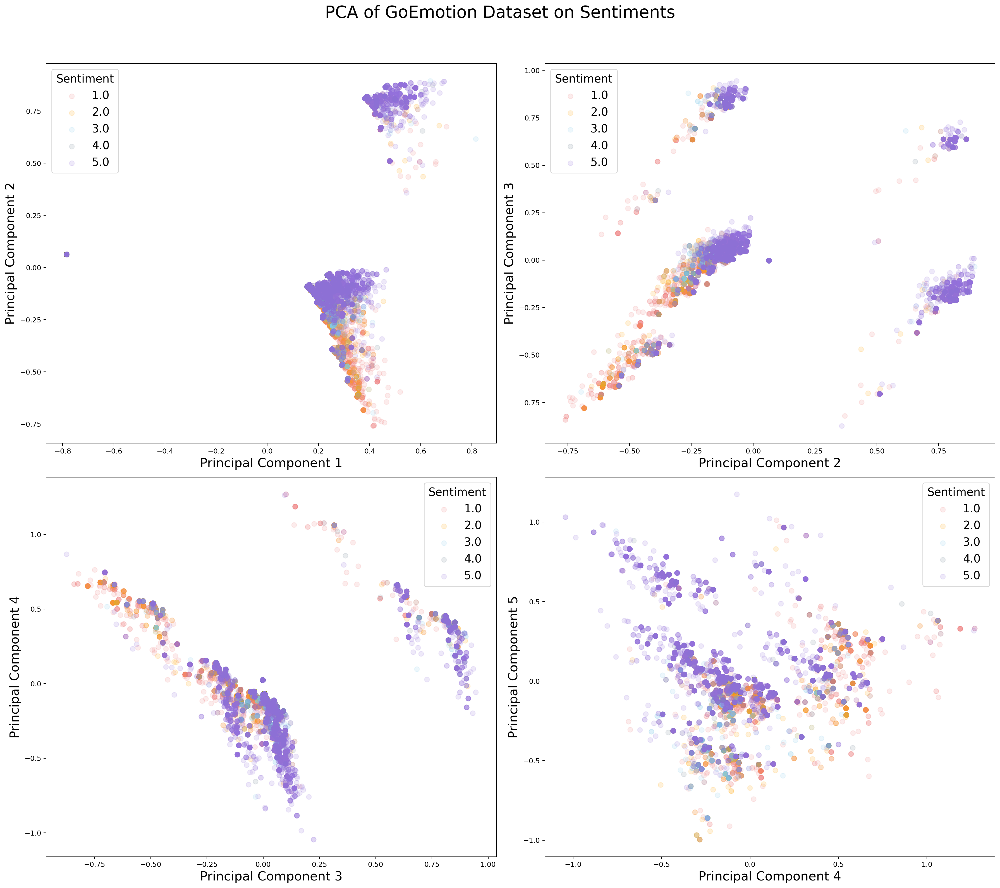

In [29]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 18), dpi=180)

targets = [1.0, 2.0, 3.0, 4.0, 5.0]
colors = ['lightcoral', 'orange', 'skyblue', 'slategray', 'mediumpurple']

# Flatten the axes array for easier iteration
axes = axes.flatten()

for i in range(4):
    ax = axes[i]
    for target, color in zip(targets, colors):
        indices_to_keep = finalDf['predicted_sentiment'] == target
        ax.scatter(finalDf.loc[indices_to_keep, f'principal component {i+1}'],
                   finalDf.loc[indices_to_keep, f'principal component {i+2}'],
                   c=color,
                   s=50,
                   alpha=0.15,
                   label=target)
    ax.set_xlabel(f'Principal Component {i+1}', fontsize=18)
    ax.set_ylabel(f'Principal Component {i+2}', fontsize=18)
    ax.legend(targets, loc='best', title='Sentiment', title_fontsize=16,
              fontsize=16)

plt.suptitle('PCA of GoEmotion Dataset on Sentiments', fontsize=24)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

#### Capture the outliners

In [30]:
# Coordinates of the center of the main cluster
main_cluster_center = np.mean(finalDf[finalDf['principal component 1'] > 0][['principal component 1', 'principal component 2']].values, axis=0)

# Reshape the main_cluster_center to be compatible for broadcasting
main_cluster_center = main_cluster_center.reshape(1, -1)

# Calculate distances of all points from the main cluster center
distances = np.linalg.norm(finalDf[['principal component 1', 'principal component 2']].values - main_cluster_center, axis=1)

# Set a distance threshold
distance_threshold = 0.5

# Identify outliers as points farther than the threshold
outlier_indices = np.where(distances > distance_threshold)[0]

# Extract the corresponding rows in the original dataset
outliers_data = df_goemo.iloc[outlier_indices]

#### Analysis of the outliners

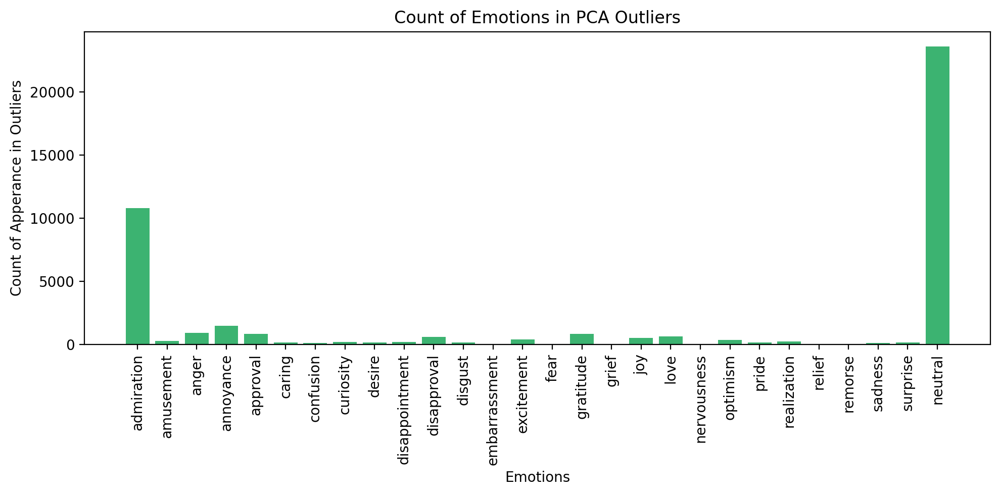

In [24]:
# Count 'Positive' in each column
positive_counts = {col: (outliers_data[col] == 1).sum() for col in emotions}

# Create the bar plot
plt.figure(figsize=(10, 5),dpi=200)
plt.bar(positive_counts.keys(), positive_counts.values(), color='mediumseagreen')
plt.xlabel('Emotions')
plt.ylabel('Count of Apperance in Outliers')
plt.title('Count of Emotions in PCA Outliers')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

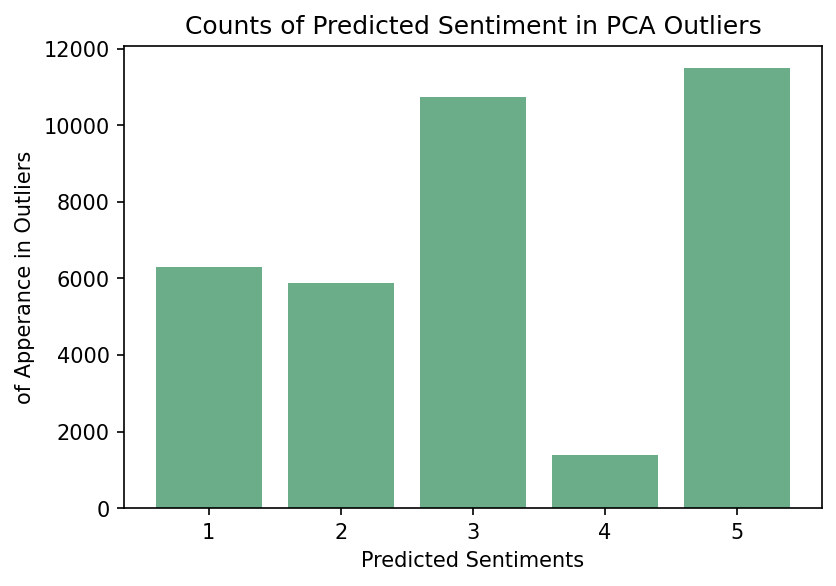

In [26]:
sentiment_counts = outliers_data['predicted_sentiment'].value_counts()

# Create the bar plot for predicted sentiment counts
plt.figure(figsize=(6, 4), dpi=150)
plt.bar(sentiment_counts.index, sentiment_counts.values, color='seagreen', alpha=0.7)
plt.xlabel('Predicted Sentiments')
plt.ylabel('of Apperance in Outliers')
plt.title('Counts of Predicted Sentiment in PCA Outliers')
plt.show()

In [34]:
# One-hot encode the predicted sentiment scores
sentiment_dummies = outliers_data[outliers_data['predicted_sentiment'].between(1, 5)]
sentiment_dummies = pd.get_dummies(sentiment_dummies['predicted_sentiment'], prefix='sentiment')

# Concatenate the one-hot encoded sentiments with the emotion columns
df_heatmap = pd.concat([outliers_data[emotions], sentiment_dummies], axis=1)
# Compute the correlation matrix
correlation_matrix = df_heatmap.corr().loc[sentiment_dummies.columns, emotions]

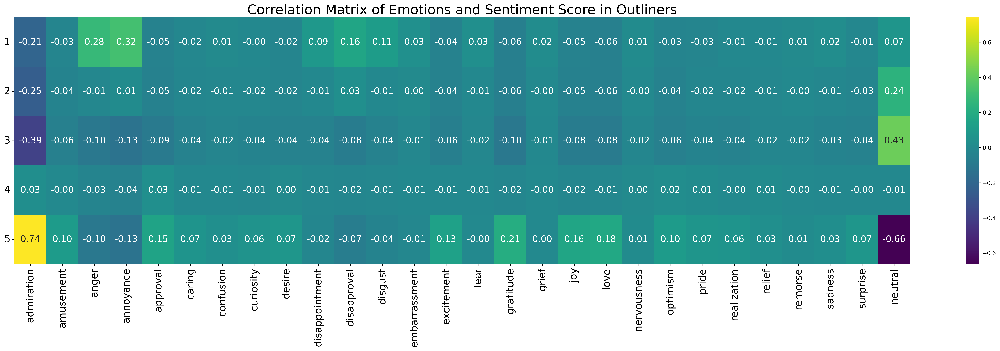

In [35]:
# Plot the heatmap
plt.figure(figsize=(36, 8),dpi=300)
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='viridis', cbar=True, 
            annot_kws={"size": 16})
plt.xticks(rotation=90, fontsize=18)
plt.yticks(ticks=np.arange(len(sentiment_dummies.columns)) + 0.5, 
           labels=[1,2,3,4,5], fontsize=18, rotation=0)
plt.title('Correlation Matrix of Emotions and Sentiment Score in Outliners', fontsize=24)
plt.show()

### PCA according to the number of labels

In [12]:
# Concatenating the target variable
df_counts = pd.concat([df_principal, df_goemo[['emotions_count']]], axis = 1)

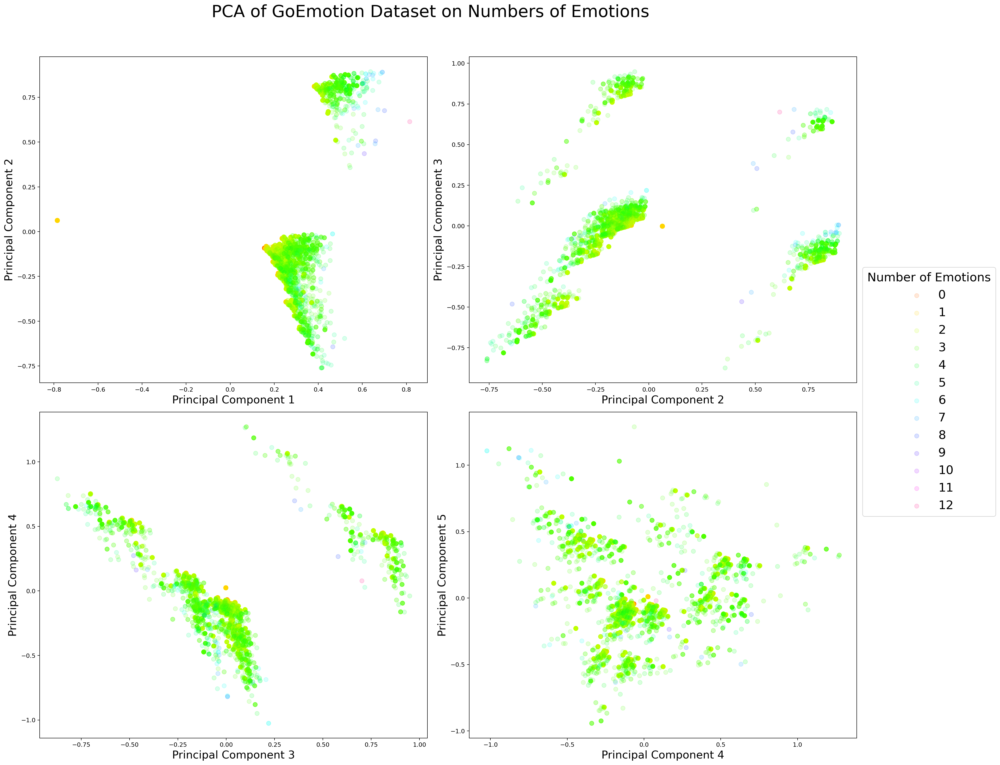

In [52]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 18), dpi=180)

targets = range(0, 13)
colors  = sns.color_palette("hsv", 13)

# Flatten the axes array for easier iteration
axes = axes.flatten()

for i in range(4):
    ax = axes[i]
    for target, color in zip(targets, colors):
        indices_to_keep = df_counts['emotions_count'] == target
        ax.scatter(df_counts.loc[indices_to_keep, f'principal component {i+1}'],
                   df_counts.loc[indices_to_keep, f'principal component {i+2}'],
                   color=color,
                   s=50,
                   alpha=0.15,
                   label=target)
    ax.set_xlabel(f'Principal Component {i+1}', fontsize=18)
    ax.set_ylabel(f'Principal Component {i+2}', fontsize=18)

# Create a single legend for the entire plot
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, fontsize=20, 
           title='Number of Emotions', title_fontsize=20,
           loc='upper right', bbox_to_anchor=(1.16, 0.65))

plt.suptitle('PCA of GoEmotion Dataset on Numbers of Emotions', fontsize=28)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

#### the single dot

In [19]:
# Coordinates of the center of the main cluster
main_cluster_center = np.mean(df_counts[df_counts['principal component 1'] > 0][['principal component 1', 'principal component 2']].values, axis=0)

# Reshape the main_cluster_center to be compatible for broadcasting
main_cluster_center = main_cluster_center.reshape(1, -1)

# Calculate distances of all points from the main cluster center
distances = np.linalg.norm(df_counts[['principal component 1', 'principal component 2']].values - main_cluster_center, axis=1)

# Set a distance threshold
distance_threshold = 0.5

# Identify outliers as points farther than the threshold
outlier_indices = np.where(distances > distance_threshold)[0]

# Extract the corresponding rows in the original dataset
outliers_data = df_goemo.iloc[outlier_indices]

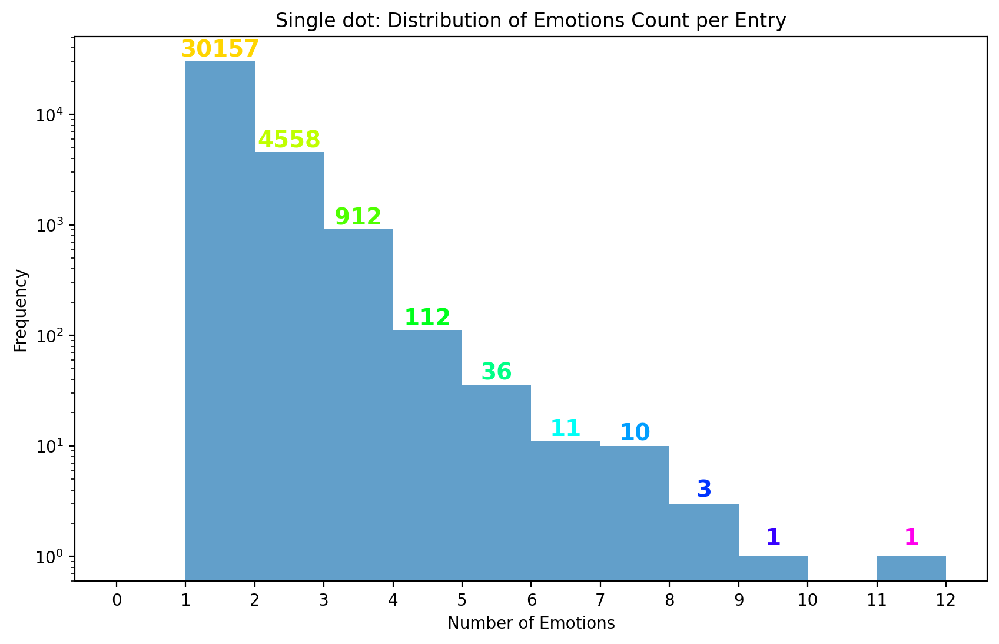

In [39]:
plt.figure(figsize=(10, 6), dpi=200)
counts, bins, patches = plt.hist(outliers_data['emotions_count'], 
                                 bins=range(int(outliers_data['emotions_count'].max()+1)), 
                                 alpha=0.7)

# Add counts above the two bar graphs
for count, bin, patch in zip(counts, bins, patches):
    idx = int(bin)
    height = patch.get_height()
    if height!= 0:
        plt.text(bin + 0.5, height + 0.15, int(count), ha='center', 
                 va='bottom',color=colors[idx], fontdict={'weight': 'bold', 'size':'14'})
    
plt.title('Single dot: Distribution of Emotions Count per Entry')
plt.xlabel('Number of Emotions')
plt.ylabel('Frequency')
plt.xticks(range(int(df_goemo['emotions_count'].max()+1)))
plt.yscale('log')
plt.grid(False)
plt.show()

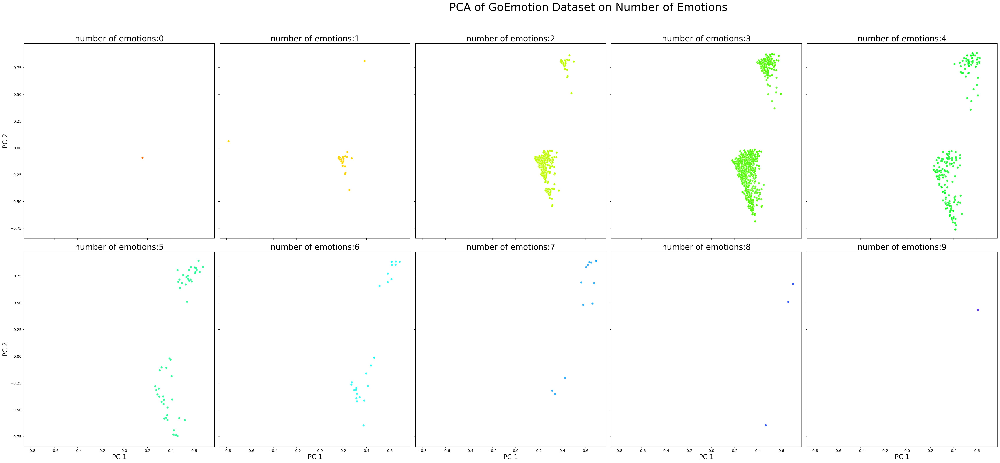

In [51]:
# Create subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(45, 18), dpi=180, sharex=True, sharey=True)
axes = axes.flatten()

numbers = range(0, 13)
colors  = sns.color_palette("hsv", 13)

for idx, number in enumerate(numbers):
    if idx >= len(axes):
        break
    ax = axes[idx]
    filtered_data = df_principal[df_goemo['emotions_count'] == number]
    if filtered_data.shape[0] != 0:
        sns.scatterplot(
            x=filtered_data['principal component 1'],
            y=filtered_data['principal component 2'],
            color=colors[idx],
            legend=False,
            alpha=0.8,
            ax=ax
        )
        ax.set_xlabel('PC 1', fontsize=18)
        ax.set_ylabel('PC 2', fontsize=18)
        ax.set_title(f'number of emotions:{idx}', fontsize=22)

plt.suptitle('PCA of GoEmotion Dataset on Number of Emotions', fontsize=30)
plt.tight_layout(rect=[0, 0, 0.85, 0.95])
plt.show()

### PCA on emotions

In [88]:
features = df_goemo[emotions].values

# Standardize the features (important for PCA)
# features = StandardScaler().fit_transform(features)

# Perform PCA
pca = PCA(n_components=5)
principalComponents = pca.fit_transform(features)
df_principal = pd.DataFrame(data = principalComponents,
                           columns = ['principal component 1', 
                                      'principal component 2', 
                                      'principal component 3',
                                      'principal component 4',
                                      'principal component 5'
                                      ])

# Concatenate the emotion labels
df_final = pd.concat([df_principal, df_goemo[emotions]], axis=1)

# Explained variance
explained_variance = pca.explained_variance_ratio_
print("Explained variance ratio:", explained_variance)
print("Total explained variance:", sum(explained_variance))

Explained variance ratio: [0.18695764 0.0920575  0.06740656 0.05919278 0.04887463]
Total explained variance: 0.45448910502229267


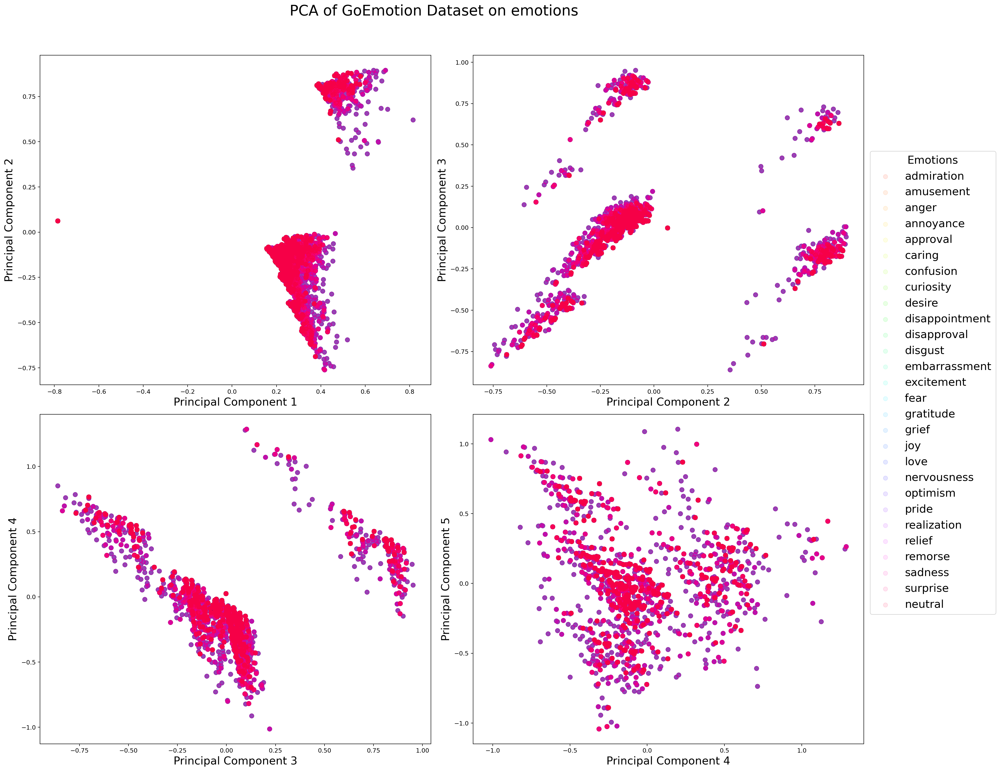

In [89]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 18), dpi=180)

cols = ['principal component 1', 'principal component 2',
       'principal component 3', 'principal component 4',
       'principal component 5']
colors = sns.color_palette("hsv", 28)

# Flatten the axes array for easier iteration
axes = axes.flatten()

for i in range(4):
    ax = axes[i]
    for idx, emotion in enumerate(emotions):
        ax.scatter(x=cols[i],
                   y=cols[i+1],
                   data=df_final,
                   color=colors[idx],
                   s=50,
                   alpha=0.1,
                   label=emotion)
    ax.set_xlabel(f'Principal Component {i+1}', fontsize=18)
    ax.set_ylabel(f'Principal Component {i+2}', fontsize=18)
    
# Create a single legend for the entire plot
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, fontsize=18, 
           title='Emotions', title_fontsize=18,
           loc='upper right', bbox_to_anchor=(1.15, 0.8))

plt.suptitle('PCA of GoEmotion Dataset on emotions', fontsize=24)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

##### subplot per emotion

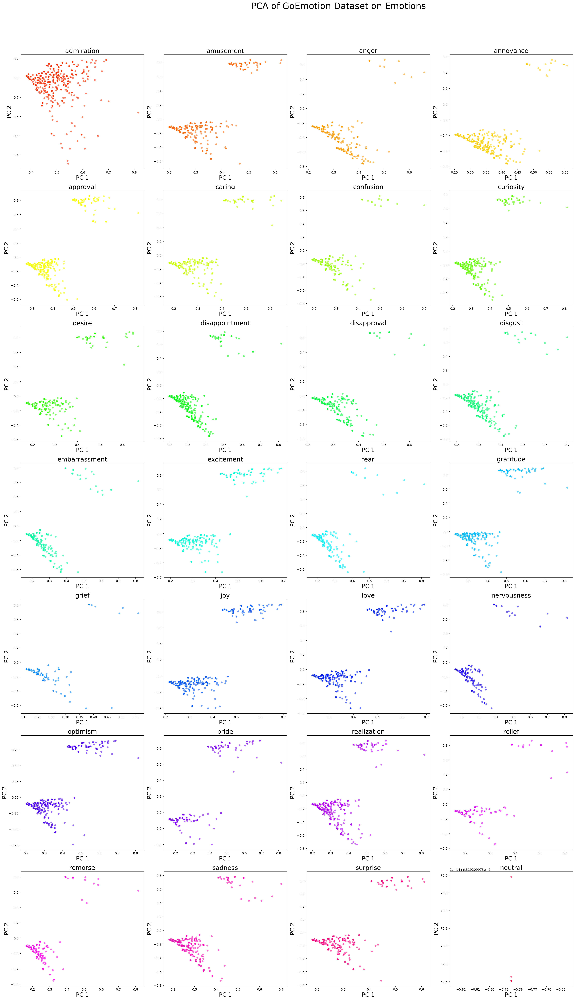

In [90]:
# Create subplots
fig, axes = plt.subplots(nrows=7, ncols=4, figsize=(30, 45), dpi=180)
axes = axes.flatten()

for idx, emotion in enumerate(emotions):
    if idx >= len(axes):
        break
    ax = axes[idx]
    filtered_data = df_principal[df_goemo[emotion] == 1]
    sns.scatterplot(
        x=filtered_data['principal component 1'],
        y=filtered_data['principal component 2'],
        color=colors[idx],
        legend=False,
        alpha=0.6,
        ax=ax
    )
    ax.set_xlabel('PC 1', fontsize=18)
    ax.set_ylabel('PC 2', fontsize=18)
    ax.set_title(emotion, fontsize=20)

plt.suptitle('PCA of GoEmotion Dataset on Emotions', fontsize=28)
plt.tight_layout(rect=[0, 0, 0.85, 0.95])
plt.show()

## down size the dataset

In [13]:
df_resampled = df_goemo.groupby('predicted_sentiment').sample(n=200, random_state=42)

# Reset the index if necessary
df_resampled.reset_index(drop=True, inplace=True)

In [14]:
def get_samples(group, n):
    return group.sample(n)

examples_per_class = df_resampled.groupby('predicted_sentiment').apply(get_samples, 200).reset_index(drop=True)

# for index, row in examples_per_class.iterrows():
#     rich.print(f"{row['text']}, {row['predicted_sentiment']}")
    
# Save the DataFrame to a CSV file
examples_per_class.to_csv("goemo_samples_200.csv", index=False)

/var/folders/mr/drkt_mk543d9rjn9b64p7mtw0000gn/T/ipykernel_92390/3931629221.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  examples_per_class = df_resampled.groupby('predicted_sentiment').apply(get_samples, 200).reset_index(drop=True)


## Negation(random)

In [15]:
# Define a function to randomly insert 'not' in a sentence
def insert_randomly(sentence):
    words = sentence.split()
    if len(words) > 1:
        rnd.seed(42)
        index = rnd.randint(0, len(words) - 1)
        words.insert(index, 'not')
    return ' '.join(words)

# Apply the function to the 'text' column and create a new column 'modified_text'
df_rnd_not = examples_per_class.copy()
df_rnd_not['modified_text'] = df_rnd_not['text'].apply(insert_randomly)


In [16]:
# Preprocess text (username and link placeholders)
def preprocess(text):
    new_text = []
    for t in text.split(" "):
        t = '@user' if t.startswith('@') and len(t) > 1 else t
        t = 'http' if t.startswith('http') else t
        new_text.append(t)
    return " ".join(new_text)

In [17]:
def predict_sentiment(text, model, tokenizer):
    encoded_input = tokenizer(text, return_tensors='pt')
    output = model(**encoded_input)
    scores = output[0][0].detach().numpy()
    scores = softmax(scores)
    # ranking = np.argsort(scores)
    # ranking = ranking[::-1]
    # rich.print(f"[green]{text}")
    # for i in range(scores.shape[0]):  
    #     l = ranking[i]+1
    #     s = scores[ranking[i]]
    #     print(f"{i+1}) {l} {np.round(float(s), 4)}")
    sentiment = scores.argmax() + 1
    return sentiment
    

In [18]:
df_rnd_not['augmented_sentiment'] = df_rnd_not['modified_text'].apply(lambda x: predict_sentiment(x, model, tokenizer))

In [ ]:
# Plot sentiment score comparison
plt.figure(figsize=(6, 6),dpi=200)
sns.histplot(df_rnd_not[['predicted_sentiment', 'augmented_sentiment']], kde=True, palette="viridis", bins=5)
plt.title('Comparison of Sentiment Scores between Original and Augmented Text')
plt.xlabel('Sentiment Score')
plt.legend(['Augmented Sentiment', 'Original Sentiment', ])
plt.show()

: 

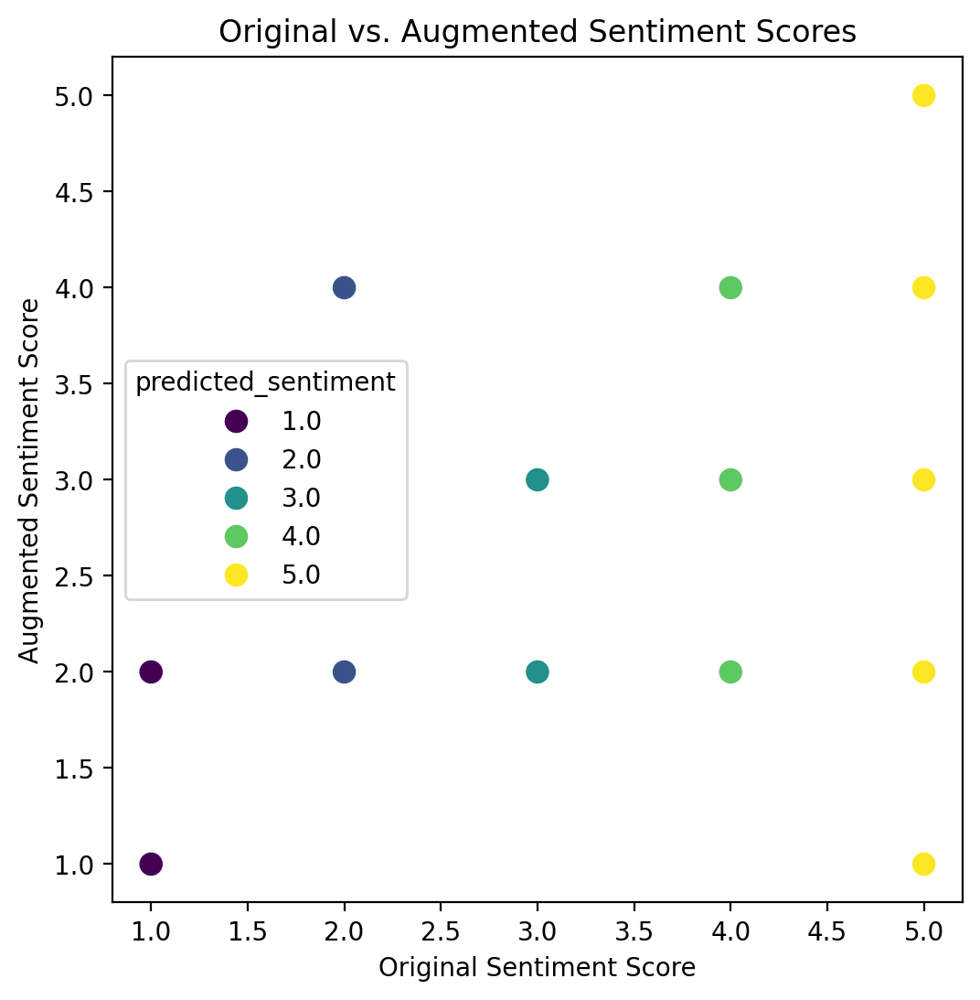

In [ ]:
# Scatter plot to show individual comparison
plt.figure(figsize=(6, 6),dpi=200)
sns.scatterplot(x='predicted_sentiment', y='augmented_sentiment', data=df_rnd_not, 
                hue='predicted_sentiment', palette='viridis', s=100)
plt.title('Original vs. Augmented Sentiment Scores')
plt.xlabel('Original Sentiment Score')
plt.ylabel('Augmented Sentiment Score')
plt.show()

### some examples

In [ ]:
for text in df_rnd_not['text'].sample(5):
    text = preprocess(text)
    encoded_input = tokenizer(text, return_tensors='pt')
    output = model(**encoded_input)
    scores = output[0][0].detach().numpy()
    scores = softmax(scores)
    ranking = np.argsort(scores)
    ranking = ranking[::-1]
    rich.print(f"[cyan1]{df_rnd_not[df_rnd_not['text'] == text]['predicted_sentiment'].values[0]} [green]{text} [red]vs. [green]{df_rnd_not[df_rnd_not['text'] == text]['modified_text'].values[0]}")
    for i in range(scores.shape[0]):
        l = ranking[i]+1
        s = scores[ranking[i]]
        print(f"{i+1}) {l} {np.round(float(s), 4)}")

4.0 The best role you can take to climb is shot caller. Give your team the information they're not aware of and 
they'll be more useful. vs. The best role you can take to climb is shot caller. Give your team the information 
they're not aware of not and they'll be more useful.

1) 4 0.5331
2) 5 0.2152
3) 3 0.1757
4) 2 0.0506
5) 1 0.0254


1.0 I'm not a fan of the model and the animations in general. He looks incredibly slapdash. vs. I'm not a not fan 
of the model and the animations in general. He looks incredibly slapdash.

1) 1 0.6229
2) 2 0.2496
3) 3 0.048
4) 4 0.0413
5) 5 0.0381


2.0 Not gonna bother reading that you're not gonna change my mind lol vs. Not gonna bother reading that you're not 
gonna change my not mind lol

1) 2 0.5073
2) 3 0.1995
3) 1 0.1593
4) 4 0.0992
5) 5 0.0347


2.0 All the replies take his quote a little too seriously vs. All not the replies take his quote a little too 
seriously

1) 2 0.5369
2) 1 0.1919
3) 3 0.1561
4) 4 0.079
5) 5 0.036


5.0 This was so good I groaned audibly. vs. This was so good I not groaned audibly.

1) 5 0.6969
2) 4 0.1539
3) 3 0.0511
4) 1 0.0492
5) 2 0.0489


In [ ]:
df_diff_sentiment = df_rnd_not[df_rnd_not['predicted_sentiment'] != df_rnd_not['augmented_sentiment']]

# Print the results
for index, row in df_diff_sentiment.iterrows():
    print(f"Original Text: {row['text']}")
    print(f"Original Sentiment: {row['predicted_sentiment']}")
    print(f"Augmented Text: {row['modified_text']}")
    print(f"Augmented Sentiment: {row['augmented_sentiment']}")
    print("-" * 50)

Original Text: I'm thinking he ment [NAME] but he's still a karma stealing whore.
Original Sentiment: 1.0
Augmented Text: I'm thinking he ment [NAME] but he's still a karma not stealing whore.
Augmented Sentiment: 2
--------------------------------------------------
Original Text: Oh sh*t guys I got banned
Original Sentiment: 1.0
Augmented Text: Oh sh*t guys I got not banned
Augmented Sentiment: 2
--------------------------------------------------
Original Text: So this is how democracy dies... With thunderous upvotes.
Original Sentiment: 1.0
Augmented Text: So not this is how democracy dies... With thunderous upvotes.
Augmented Sentiment: 2
--------------------------------------------------
Original Text: He’s creepy
Original Sentiment: 1.0
Augmented Text: not He’s creepy
Augmented Sentiment: 2
--------------------------------------------------
Original Text: Yeah fucking thanks, politicians back in the day.
Original Sentiment: 1.0
Augmented Text: Yeah not fucking thanks, politicians 

In [ ]:
# Calculate the percentage of changed sentiment scores
num_changed = (df_rnd_not['predicted_sentiment'] != df_rnd_not['augmented_sentiment']).sum()
total_texts = len(df_rnd_not)
percentage_changed = (num_changed / total_texts) * 100

# Calculate the magnitude of the change
df_rnd_not['sentiment_change'] = (df_rnd_not['predicted_sentiment'] - df_rnd_not['augmented_sentiment']).abs()
average_change_magnitude = df_rnd_not['sentiment_change'].mean()

print(f"Percentage of texts with changed sentiment scores: {percentage_changed:.2f}%")
print(f"Average magnitude of sentiment score change: {average_change_magnitude:.2f}")

Percentage of texts with changed sentiment scores: 23.00%
Average magnitude of sentiment score change: 0.37


### before

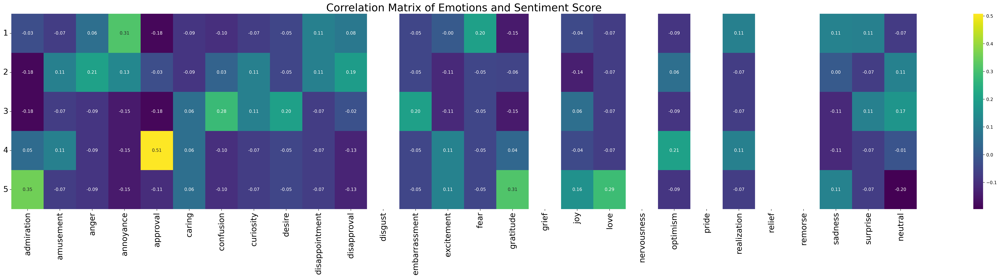

In [ ]:
# One-hot encode the predicted sentiment scores
sentiment_dummies = df_rnd_not[df_rnd_not['predicted_sentiment'].between(1, 5)]
sentiment_dummies = pd.get_dummies(sentiment_dummies['predicted_sentiment'], prefix='sentiment')

# Concatenate the one-hot encoded sentiments with the emotion columns
df_heatmap = pd.concat([df_rnd_not[emotions], sentiment_dummies], axis=1)
# Compute the correlation matrix
correlation_matrix = df_heatmap.corr().loc[sentiment_dummies.columns, emotions]

# Plot the heatmap
plt.figure(figsize=(46, 8),dpi=300)
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='viridis', cbar=True)
plt.xticks(rotation=90, fontsize=18)
plt.yticks(ticks=np.arange(len(sentiment_dummies.columns)) + 0.5, 
           labels=[1,2,3,4,5], fontsize=18, rotation=0)
plt.title('Correlation Matrix of Emotions and Sentiment Score', fontsize=24)
plt.show()

### after

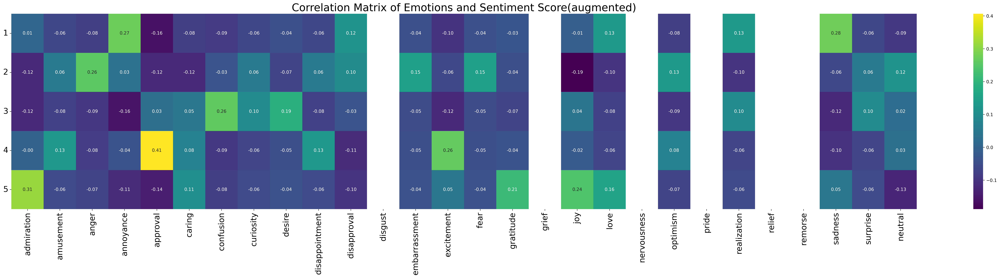

In [ ]:
# One-hot encode the predicted sentiment scores
sentiment_dummies = df_rnd_not[df_rnd_not['augmented_sentiment'].between(1, 5)]
sentiment_dummies = pd.get_dummies(sentiment_dummies['augmented_sentiment'], prefix='sentiment')

# Concatenate the one-hot encoded sentiments with the emotion columns
df_heatmap = pd.concat([df_rnd_not[emotions], sentiment_dummies], axis=1)
# Compute the correlation matrix
correlation_matrix = df_heatmap.corr().loc[sentiment_dummies.columns, emotions]

# Plot the heatmap
plt.figure(figsize=(46, 8),dpi=300)
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='viridis', cbar=True)
plt.xticks(rotation=90, fontsize=18)
plt.yticks(ticks=np.arange(len(sentiment_dummies.columns)) + 0.5, 
           labels=[1,2,3,4,5], fontsize=18, rotation=0)
plt.title('Correlation Matrix of Emotions and Sentiment Score(augmented)', fontsize=24)
plt.show()

## Negation using correct syntax

In [ ]:
# Function to insert 'not' with correct syntax
def insert_correctly(sentence):
    words = word_tokenize(sentence)
    pos_tags = pos_tag(words)
    inserted = False
    
    for i, (word, tag) in enumerate(pos_tags):
        if tag in ['VBZ', 'VBP', 'VBD', 'MD', 'VBG', 'VBN'] and not inserted:
            words.insert(i + 1, 'not')
            inserted = True
            break
            
    if not inserted:
        words.insert(0, 'not')
    
    return ' '.join(words)

# Apply the function to the 'text' column and create a new column 'modified_text'
df_syn_not = examples_per_class.copy()
df_syn_not['augmented_text'] = df_syn_not['text'].apply(insert_correctly)

In [ ]:
df_syn_not['augmented_sentiment'] = df_syn_not['augmented_text'].apply(lambda x: predict_sentiment(x, model, tokenizer))

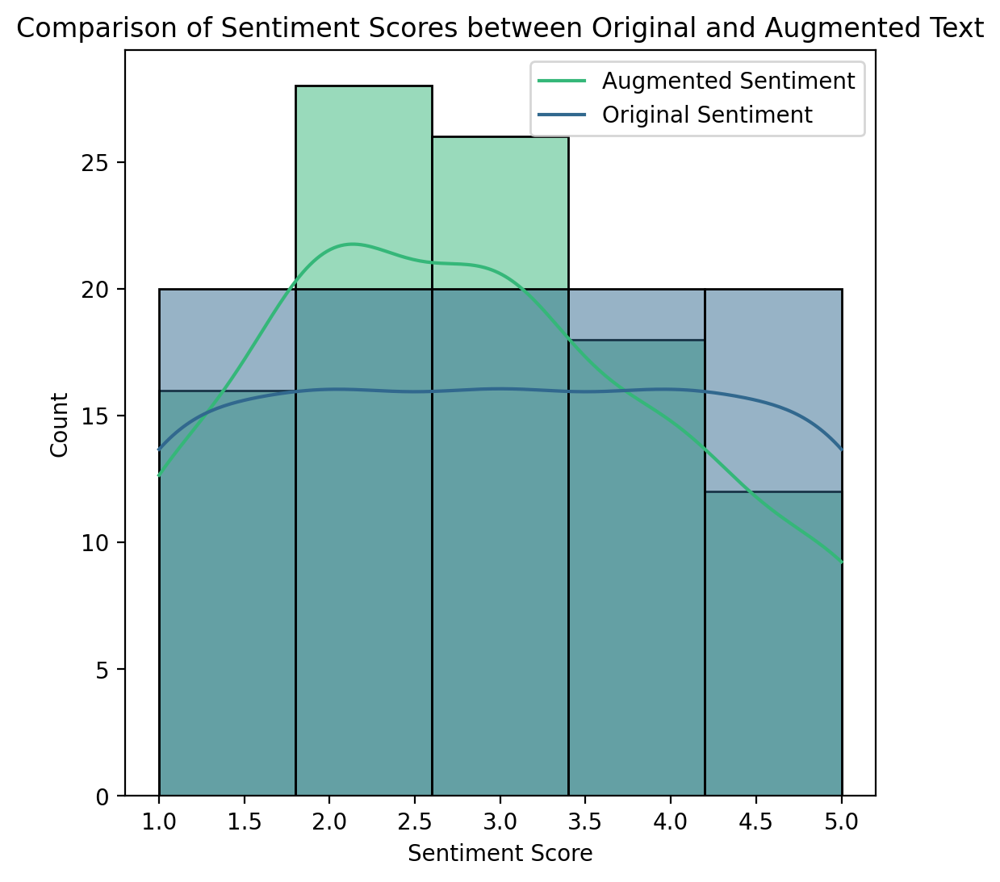

In [ ]:
# Plot sentiment score comparison
plt.figure(figsize=(6, 6),dpi=200)
sns.histplot(df_syn_not[['predicted_sentiment', 'augmented_sentiment']], kde=True, palette="viridis", bins=5)
plt.title('Comparison of Sentiment Scores between Original and Augmented Text')
plt.xlabel('Sentiment Score')
plt.legend(['Augmented Sentiment', 'Original Sentiment', ])
plt.show()

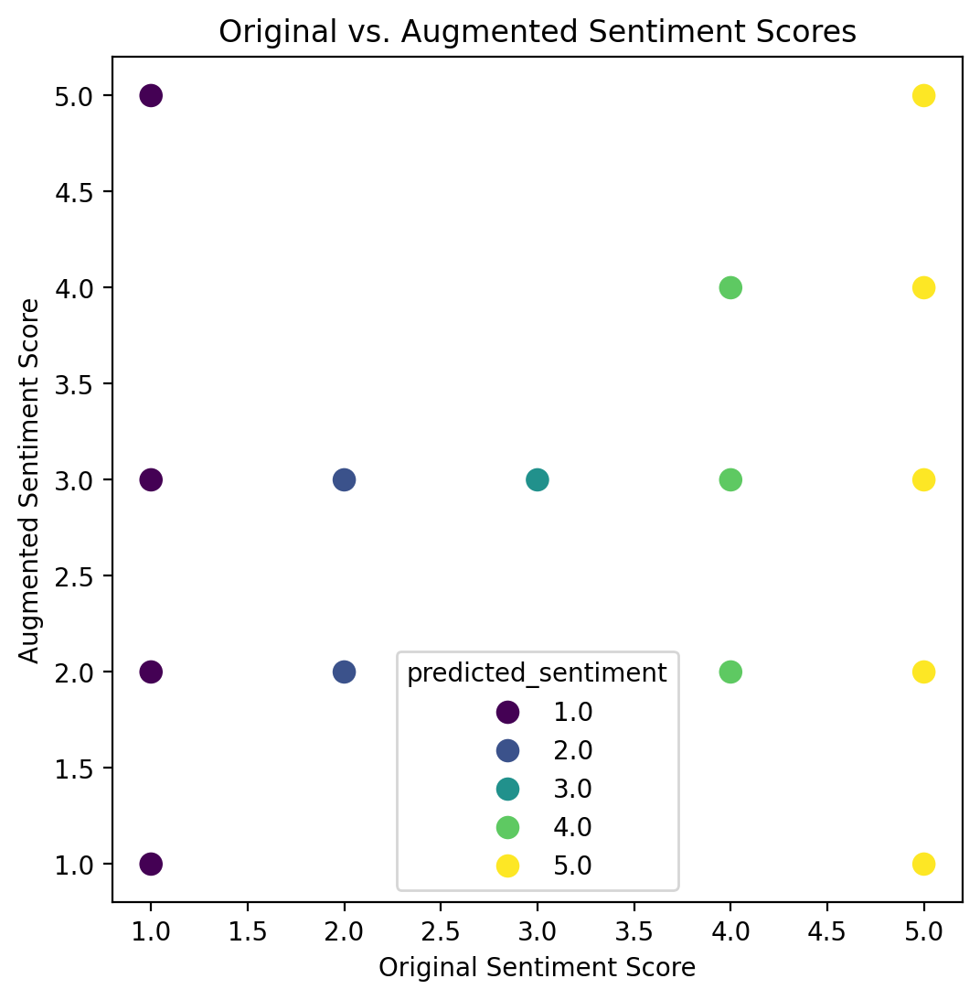

In [ ]:
# Scatter plot to show individual comparison
plt.figure(figsize=(6, 6),dpi=200)
sns.scatterplot(x='predicted_sentiment', y='augmented_sentiment', data=df_syn_not, 
                hue='predicted_sentiment', palette='viridis', s=100)
plt.title('Original vs. Augmented Sentiment Scores')
plt.xlabel('Original Sentiment Score')
plt.ylabel('Augmented Sentiment Score')
plt.show()

### some examples

In [ ]:
for text in df_syn_not['text'].sample(5):
    text = preprocess(text)
    encoded_input = tokenizer(text, return_tensors='pt')
    output = model(**encoded_input)
    scores = output[0][0].detach().numpy()
    scores = softmax(scores)
    ranking = np.argsort(scores)
    ranking = ranking[::-1]
    rich.print(f"[cyan1]{df_syn_not[df_syn_not['text'] == text]['predicted_sentiment'].values[0]} [green]{text} [red]vs. [green]{df_syn_not[df_syn_not['text'] == text]['augmented_text'].values[0]}")
    for i in range(scores.shape[0]):
        l = ranking[i]+1
        s = scores[ranking[i]]
        print(f"{i+1}) {l} {np.round(float(s), 4)}")

3.0 I feel like that would just be a net positive for guys, is that what she wants? vs. I feel not like that would 
just be a net positive for guys , is that what she wants ?

1) 3 0.5202
2) 4 0.2542
3) 2 0.14
4) 5 0.0472
5) 1 0.0384


1.0 I know you can’t read this, but I feel really bad and hope you learn to read soon  vs. I know not you can ’ t 
read this , but I feel really bad and hope you learn to read soon

1) 1 0.5441
2) 2 0.3195
3) 3 0.0569
4) 4 0.0437
5) 5 0.0358


1.0 So glad you left and didn’t just sit through the date with that idiot! vs. So glad you left not and didn ’ t 
just sit through the date with that idiot !

1) 1 0.6495
2) 2 0.2329
3) 3 0.0453
4) 4 0.037
5) 5 0.0353


5.0 Thanks everybody! vs. not Thanks everybody !

1) 5 0.5613
2) 4 0.2576
3) 3 0.0918
4) 1 0.0456
5) 2 0.0437


3.0 Check out the name of the guy above me I was just making an EFT joke vs. Check out the name of the guy above me
I was not just making an EFT joke

1) 3 0.5093
2) 4 0.3186
3) 2 0.0887
4) 5 0.0573
5) 1 0.0261


In [ ]:
df_diff_sentiment = df_syn_not[df_syn_not['predicted_sentiment'] != df_syn_not['augmented_sentiment']]

# Print the results
for index, row in df_diff_sentiment.iterrows():
    print(f"Original Text: {row['text']}")
    print(f"Original Sentiment: {row['predicted_sentiment']}")
    print(f"Augmented Text: {row['augmented_text']}")
    print(f"Augmented Sentiment: {row['augmented_sentiment']}")
    print("-" * 50)

Original Text: I have endured worse.
Original Sentiment: 1.0
Augmented Text: I have not endured worse .
Augmented Sentiment: 2
--------------------------------------------------
Original Text: This is gross and sweet at the same time. Great parenting.
Original Sentiment: 1.0
Augmented Text: This is not gross and sweet at the same time . Great parenting .
Augmented Sentiment: 5
--------------------------------------------------
Original Text: Don’t put that evil on [NAME]
Original Sentiment: 1.0
Augmented Text: Don ’ t put not that evil on [ NAME ]
Augmented Sentiment: 2
--------------------------------------------------
Original Text: Oh sh*t guys I got banned
Original Sentiment: 1.0
Augmented Text: Oh sh * t guys I got not banned
Augmented Sentiment: 2
--------------------------------------------------
Original Text: So this is how democracy dies... With thunderous upvotes.
Original Sentiment: 1.0
Augmented Text: So this is not how democracy dies ... With thunderous upvotes .
Augmente

In [ ]:
# Calculate the percentage of changed sentiment scores
num_changed = (df_syn_not['predicted_sentiment'] != df_syn_not['augmented_sentiment']).sum()
total_texts = len(df_syn_not)
percentage_changed = (num_changed / total_texts) * 100

# Calculate the magnitude of the change
df_syn_not['sentiment_change'] = (df_syn_not['predicted_sentiment'] - df_syn_not['augmented_sentiment']).abs()
average_change_magnitude = df_syn_not['sentiment_change'].mean()

print(f"Percentage of texts with changed sentiment scores: {percentage_changed:.2f}%")
print(f"Average magnitude of sentiment score change: {average_change_magnitude:.2f}")

Percentage of texts with changed sentiment scores: 21.00%
Average magnitude of sentiment score change: 0.42


### after

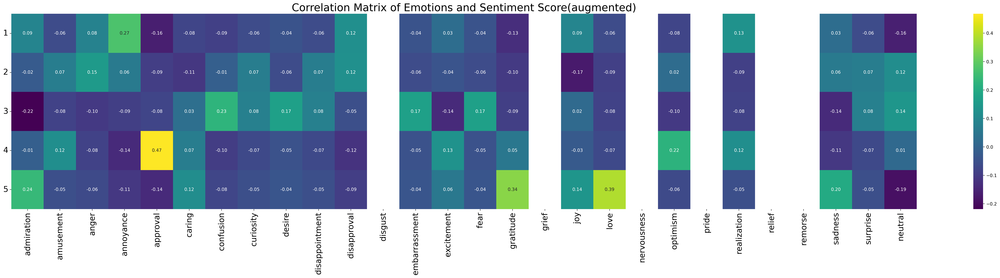

In [ ]:
# One-hot encode the predicted sentiment scores
sentiment_dummies = df_syn_not[df_syn_not['augmented_sentiment'].between(1, 5)]
sentiment_dummies = pd.get_dummies(sentiment_dummies['augmented_sentiment'], prefix='sentiment')

# Concatenate the one-hot encoded sentiments with the emotion columns
df_heatmap = pd.concat([df_syn_not[emotions], sentiment_dummies], axis=1)
# Compute the correlation matrix
correlation_matrix = df_heatmap.corr().loc[sentiment_dummies.columns, emotions]

# Plot the heatmap
plt.figure(figsize=(46, 8),dpi=300)
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='viridis', cbar=True)
plt.xticks(rotation=90, fontsize=18)
plt.yticks(ticks=np.arange(len(sentiment_dummies.columns)) + 0.5, 
           labels=[1,2,3,4,5], fontsize=18, rotation=0)
plt.title('Correlation Matrix of Emotions and Sentiment Score(augmented)', fontsize=24)
plt.show()

## Replace the adjectives

In [ ]:
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/xyc/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to /Users/xyc/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /Users/xyc/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [ ]:
df_adj_replace = examples_per_class.copy()

In [ ]:
# Function to extract adjectives from a sentence
def extract_adjectives(sentence):
    words = nltk.word_tokenize(sentence)
    pos_tags = nltk.pos_tag(words)
    adjectives = [word for word, tag in pos_tags if tag == 'JJ']
    return adjectives

# Function to find antonyms for a given word
def find_antonyms(word):
    antonyms = set()
    for syn in wordnet.synsets(word):
        for lemma in syn.lemmas():
            if lemma.antonyms():
                antonyms.add(lemma.antonyms()[0].name())
    return antonyms

In [ ]:
# Extract all adjectives from the 'text' column
all_adjectives = df_adj_replace['text'].apply(extract_adjectives).explode().dropna().unique()

# Create a dictionary of adjectives and their antonyms
antonym_dict = {}
for adj in all_adjectives:
    antonyms = find_antonyms(adj)
    if antonyms:
        antonym_dict[adj] = list(antonyms)[0]

antonym_dict

{'glad': 'sad',
 'gross': 'net',
 'sweet': 'dry',
 'same': 'other',
 'awful': 'nice',
 'general': 'specific',
 'bad': 'unregretful',
 'accurate': 'inaccurate',
 'other': 'same',
 'stupid': 'intelligent',
 'ineffectual': 'effective',
 'simple': 'compound',
 'unable': 'able',
 'unbelievable': 'credible',
 'serious': 'frivolous',
 'real': 'unreal',
 'sure': 'uncertain',
 'little': 'big',
 'many': 'few',
 'uneducated': 'educated',
 'net': 'gross',
 'positive': 'negative',
 'much': 'little',
 'ambiguous': 'unambiguous',
 'vague': 'defined',
 'attractive': 'repulsive',
 'feminine': 'unwomanly',
 'wireless': 'wired',
 'aware': 'unmindful',
 'useful': 'useless',
 'good': 'ill',
 'big': 'little',
 'fair': 'unfairly',
 'new': 'old',
 'safe': 'out',
 'loving': 'unloving',
 'whole': 'half',
 'second': 'first',
 'right': 'falsify',
 'first': 'middle',
 'Happy': 'unhappy',
 'happy': 'unhappy'}

In [ ]:
def augment_text_with_antonyms(text, antonym_dict):
    words = text.split()
    augmented_words = [antonym_dict.get(word.lower(), word) for word in words]
    augmented_text = ' '.join(augmented_words)
    return augmented_text

In [ ]:
# Apply the augmentation function to the original text
df_adj_replace['augmented_text'] = df_adj_replace['text'].apply(lambda x: augment_text_with_antonyms(x, antonym_dict))
df_adj_replace['augmented_sentiment'] = df_adj_replace['augmented_text'].apply(lambda x: predict_sentiment(x, model, tokenizer))

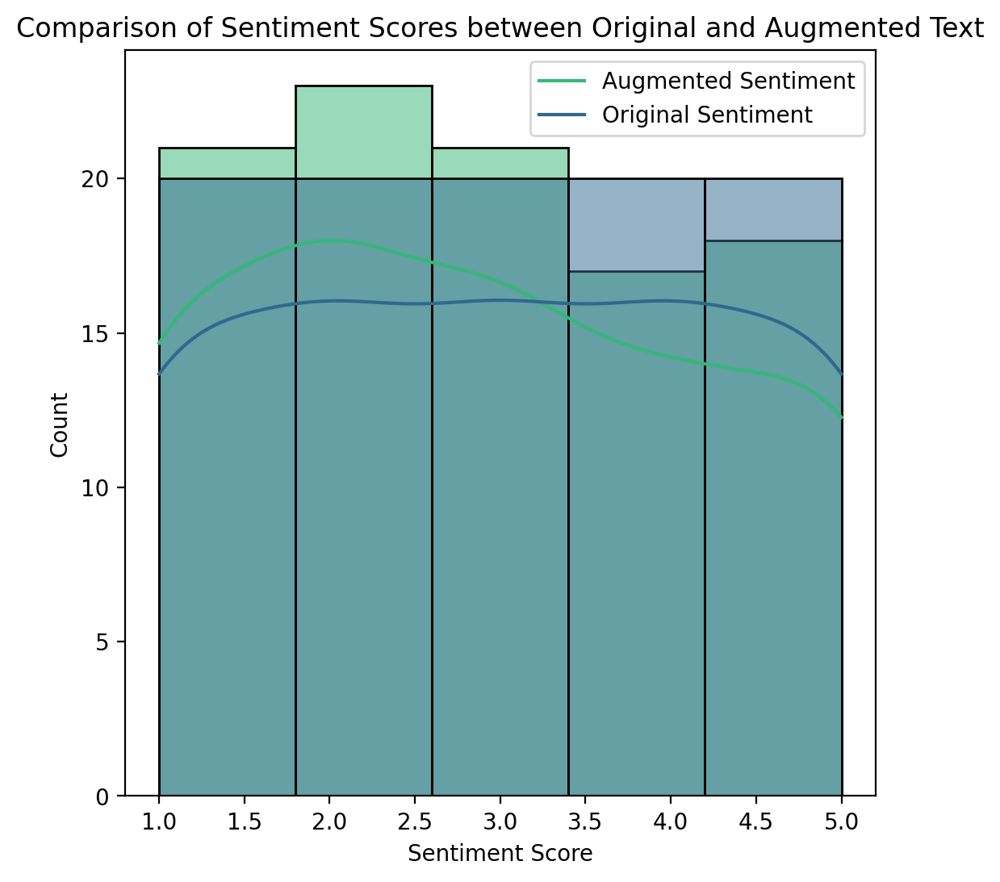

In [ ]:
# Plot sentiment score comparison
plt.figure(figsize=(6, 6),dpi=200)
sns.histplot(df_adj_replace[['predicted_sentiment', 'augmented_sentiment']], kde=True, palette="viridis", bins=5)
plt.title('Comparison of Sentiment Scores between Original and Augmented Text')
plt.xlabel('Sentiment Score')
plt.legend(['Augmented Sentiment', 'Original Sentiment', ])
plt.show()

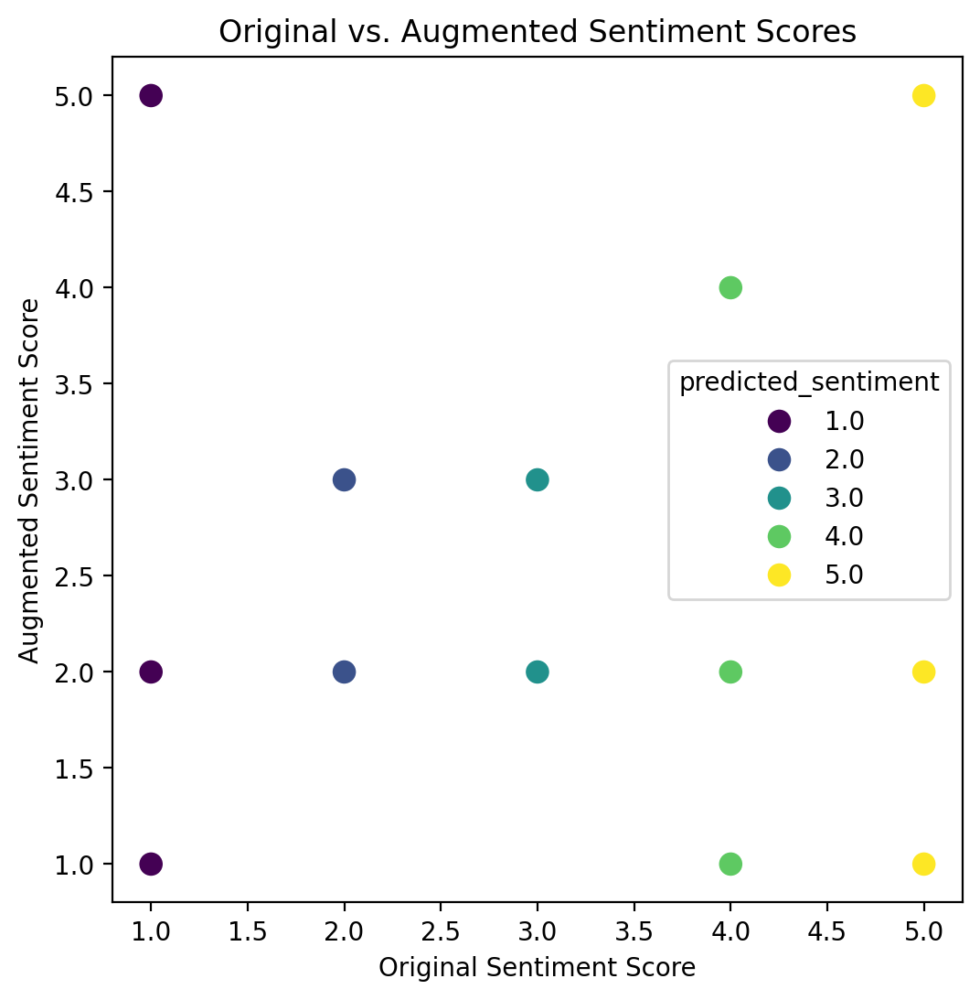

In [ ]:
# Scatter plot to show individual comparison
plt.figure(figsize=(6, 6),dpi=200)
sns.scatterplot(x='predicted_sentiment', y='augmented_sentiment', data=df_adj_replace, 
                hue='predicted_sentiment', palette='viridis', s=100)
plt.title('Original vs. Augmented Sentiment Scores')
plt.xlabel('Original Sentiment Score')
plt.ylabel('Augmented Sentiment Score')
plt.show()

### some examples

In [ ]:
for text in df_rnd_not['text'].sample(5):
    text = preprocess(text)
    encoded_input = tokenizer(text, return_tensors='pt')
    output = model(**encoded_input)
    scores = output[0][0].detach().numpy()
    scores = softmax(scores)
    ranking = np.argsort(scores)
    ranking = ranking[::-1]
    rich.print(f"[cyan1]{df_adj_replace[df_adj_replace['text'] == text]['predicted_sentiment'].values[0]} [green]{text} [red]vs. [green]{df_adj_replace[df_adj_replace['text'] == text]['augmented_text'].values[0]}")
    for i in range(scores.shape[0]):
        l = ranking[i]+1
        s = scores[ranking[i]]
        print(f"{i+1}) {l} {np.round(float(s), 4)}")

2.0 I made the mistake of choosing [NAME] once. I'm literaly unable to change characters in Tekken for the rest of 
my life. vs. I made the mistake of choosing [NAME] once. I'm literaly able to change characters in Tekken for the 
rest of my life.

1) 2 0.5042
2) 3 0.2181
3) 1 0.1188
4) 4 0.1174
5) 5 0.0415


2.0 All the replies take his quote a little too seriously vs. All the replies take his quote a big too seriously

1) 2 0.5369
2) 1 0.1919
3) 3 0.1561
4) 4 0.079
5) 5 0.036


4.0 Oh alright fair enough haha. If the sabres dont pan out I'll root for him also! vs. Oh alright unfairly enough 
haha. If the sabres dont pan out I'll root for him also!

1) 4 0.508
2) 3 0.2563
3) 5 0.1688
4) 2 0.048
5) 1 0.019


2.0 Thank god I'm not dating anymore. I wouldn't want to risk some girl I'm trying to bang seeing my reddit 
history. vs. Thank god I'm not dating anymore. I wouldn't want to risk some girl I'm trying to bang seeing my 
reddit history.

1) 2 0.5398
2) 1 0.1756
3) 3 0.1539
4) 4 0.0954
5) 5 0.0353


1.0 Yeah fucking thanks, politicians back in the day. vs. Yeah fucking thanks, politicians back in the day.

1) 1 0.5134
2) 2 0.3247
3) 3 0.0613
4) 4 0.0518
5) 5 0.0488


In [ ]:
df_diff_sentiment = df_adj_replace[df_adj_replace['predicted_sentiment'] != df_adj_replace['augmented_sentiment']]

# Print the results
for index, row in df_diff_sentiment.iterrows():
    print(f"Original Text: {row['text']}")
    print(f"Original Sentiment: {row['predicted_sentiment']}")
    print(f"Augmented Text: {row['augmented_text']}")
    print(f"Augmented Sentiment: {row['augmented_sentiment']}")
    print("-" * 50)

Original Text: This is gross and sweet at the same time. Great parenting.
Original Sentiment: 1.0
Augmented Text: This is net and dry at the other time. Great parenting.
Augmented Sentiment: 5
--------------------------------------------------
Original Text: Minor league team names are often embarrassing...Biscuits, Rumble Ponies, Sand Gnats. Baby Cakes is particularly awful though, I’ll grant you that.
Original Sentiment: 1.0
Augmented Text: Minor league team names are often embarrassing...Biscuits, Rumble Ponies, Sand Gnats. Baby Cakes is particularly nice though, I’ll grant you that.
Augmented Sentiment: 2
--------------------------------------------------
Original Text: I made the mistake of choosing [NAME] once. I'm literaly unable to change characters in Tekken for the rest of my life.
Original Sentiment: 2.0
Augmented Text: I made the mistake of choosing [NAME] once. I'm literaly able to change characters in Tekken for the rest of my life.
Augmented Sentiment: 3
----------------

In [ ]:
# Calculate the percentage of changed sentiment scores
num_changed = (df_adj_replace['predicted_sentiment'] != df_adj_replace['augmented_sentiment']).sum()
total_texts = len(df_adj_replace)
percentage_changed = (num_changed / total_texts) * 100

# Calculate the magnitude of the change
df_adj_replace['sentiment_change'] = (df_adj_replace['predicted_sentiment'] - df_adj_replace['augmented_sentiment']).abs()
average_change_magnitude = df_adj_replace['sentiment_change'].mean()

print(f"Percentage of texts with changed sentiment scores: {percentage_changed:.2f}%")
print(f"Average magnitude of sentiment score change: {average_change_magnitude:.2f}")

Percentage of texts with changed sentiment scores: 11.00%
Average magnitude of sentiment score change: 0.26


### before

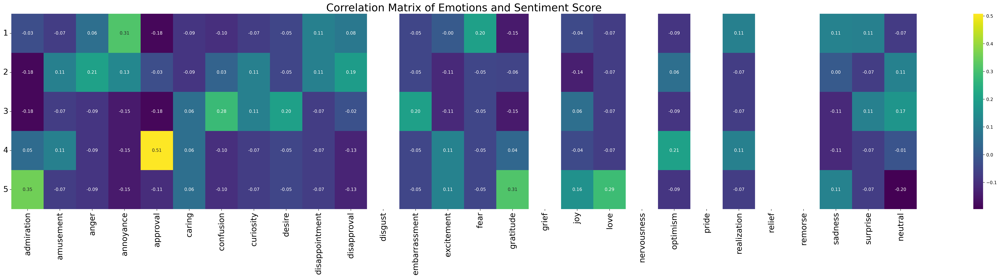

In [ ]:
# One-hot encode the predicted sentiment scores
sentiment_dummies = df_adj_replace[df_adj_replace['predicted_sentiment'].between(1, 5)]
sentiment_dummies = pd.get_dummies(sentiment_dummies['predicted_sentiment'], prefix='sentiment')

# Concatenate the one-hot encoded sentiments with the emotion columns
df_heatmap = pd.concat([df_adj_replace[emotions], sentiment_dummies], axis=1)
# Compute the correlation matrix
correlation_matrix = df_heatmap.corr().loc[sentiment_dummies.columns, emotions]

# Plot the heatmap
plt.figure(figsize=(46, 8),dpi=300)
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='viridis', cbar=True)
plt.xticks(rotation=90, fontsize=18)
plt.yticks(ticks=np.arange(len(sentiment_dummies.columns)) + 0.5, 
           labels=[1,2,3,4,5], fontsize=18, rotation=0)
plt.title('Correlation Matrix of Emotions and Sentiment Score', fontsize=24)
plt.show()

### after

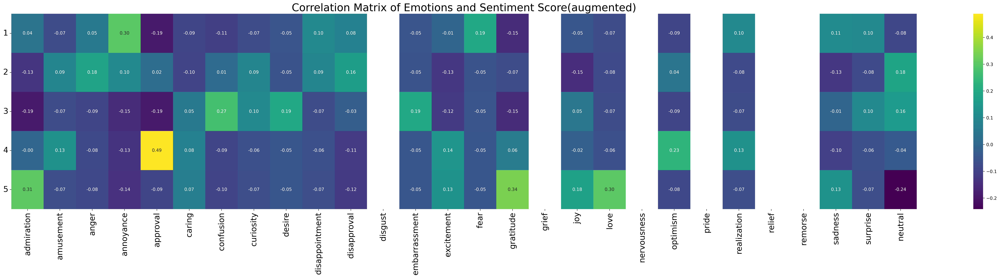

In [ ]:
# One-hot encode the predicted sentiment scores
sentiment_dummies = df_adj_replace[df_adj_replace['augmented_sentiment'].between(1, 5)]
sentiment_dummies = pd.get_dummies(sentiment_dummies['augmented_sentiment'], prefix='sentiment')

# Concatenate the one-hot encoded sentiments with the emotion columns
df_heatmap = pd.concat([df_adj_replace[emotions], sentiment_dummies], axis=1)
# Compute the correlation matrix
correlation_matrix = df_heatmap.corr().loc[sentiment_dummies.columns, emotions]

# Plot the heatmap
plt.figure(figsize=(46, 8),dpi=300)
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='viridis', cbar=True)
plt.xticks(rotation=90, fontsize=18)
plt.yticks(ticks=np.arange(len(sentiment_dummies.columns)) + 0.5, 
           labels=[1,2,3,4,5], fontsize=18, rotation=0)
plt.title('Correlation Matrix of Emotions and Sentiment Score(augmented)', fontsize=24)
plt.show()